In [ ]:

# # install opencv-contrib using the command
# # pip install --user opencv-contrib-python


# #import the required libraries
# import cv2
# import numpy as np
# import os
# from sys import exit


# # function to detect face from image
# def face_detection(image_to_detect):
#     #converting the image to grayscale since its required for eigen and fisher faces
#     image_to_detect_gray = cv2.cvtColor(image_to_detect, cv2.COLOR_BGR2GRAY)
    
#     # load the pretrained model for face detection
#     # lbpcascade is recommended for LBPH
#     # haarcascade is recommended for Eigenface and Fisherface haarcascade_frontalface_default.xml
#     # download lpbcascade from https://raw.githubusercontent.com/opencv/opencv/master/data/lbpcascades/lbpcascade_frontalface.xml
#     face_detection_classifier = cv2.CascadeClassifier('models/haarcascade_frontalface_default.xml')
#     # can also use lbpcascade_frontalface.xml
    
#     # detect all face locations in the image using classifier
#     all_face_locations = face_detection_classifier.detectMultiScale(image_to_detect_gray)
    
#     # if no faces are detected
#     if (len(all_face_locations) == 0):
#         return None, None
    
#     #splitting the tuple to get four face positions
#     x,y,width,height = all_face_locations[0]
    
#     #calculating face coordinates
#     face_coordinates = image_to_detect_gray[y:y+width, x:x+height]
    
#     #training and testing images should be of same size for eigen and fisher faces
#     #for LBPH its optional
#     face_coordinates = cv2.resize(face_coordinates,(500,500))
    
#     #return the face detected and face location
#     return face_coordinates, all_face_locations[0]


# # function to prepare training data
# def prepare_training_data(images_dir, label_index):
    
#     #list to hold all the faces and label indexes
#     faces_coordinates = []
#     labels_index = []
    
#     #get the image names from the given directory
#     images = os.listdir(images_dir)
    
#     for image in images:
#         image_path = images_dir + "/" + image
#         training_image = cv2.imread(image_path)
#         #display the current image taken for training
#         cv2.imshow("Training in progress for "+names[label_index], cv2.resize(training_image,(500,500)))
#         cv2.waitKey(100)
        
#         #detect face using the method for detection
#         face_coordinates, box_coordinates = face_detection(training_image)
        
#         if face_coordinates is not None:
#             # add the returned face to the list of faces
#             faces_coordinates.append(face_coordinates)
#             labels_index.append(label_index)
    
#     return faces_coordinates, labels_index

# ###### preprocessing ##############
# names = []

# names.append("Narendra Modi")
# face_coordinates_modi, labels_index_modi = prepare_training_data("dataset/training/modi",0)
    
# names.append("Joe Biden")
# face_coordinates_biden, labels_index_biden = prepare_training_data("dataset/training/biden",1)
    
# face_coordinates = face_coordinates_modi + face_coordinates_biden
# labels_index = labels_index_modi + labels_index_biden

# #print total number of faces and names
# print("Total faces:", len(face_coordinates))
# print("Total names:", len(names))


# ######## training ###############

# #create the instance of face recognizer
# face_classifier = cv2.face.FisherFaceRecognizer_create()
# #cv2.face.EigenFaceRecognizer_create()
# #cv2.face.FisherFaceRecognizer_create()
# #cv2.face.LBPHFaceRecognizer_create()

# face_classifier.train(face_coordinates,np.array(labels_index))


# ######## prediction ##############
# image_to_classify = cv2.imread("dataset/testing/joe1.jpg")

# #make a copy of the image
# image_to_classify_copy = image_to_classify.copy()

# #get the face from the image
# face_coordinates_classify, box_locations = face_detection(image_to_classify_copy)  

# #if no faces are returned
# if face_coordinates_classify is None:
#     print("There are no faces in the image to classify")
#     exit()
    
# #if not none, we have predict the face
# name_index, distance = face_classifier.predict(face_coordinates_classify)
# name = names[name_index]
# distance = abs(distance)

# #draw bounding box and text for the face detected
# (x,y,w,h) = box_locations
# cv2.rectangle(image_to_classify,(x,y),(x+w, y+h),(0,255,0),2)
# cv2.putText(image_to_classify,name,(x,y-5),cv2.FONT_HERSHEY_PLAIN,2.5,(0,255,0),2)

# #show the image in window
# cv2.imshow("Prediction "+name, cv2.resize(image_to_classify, (500,500)))
# cv2.waitKey(0)
# cv2.destroyAllWindows()



Training in progress for Narendra Modi - 4.jpg


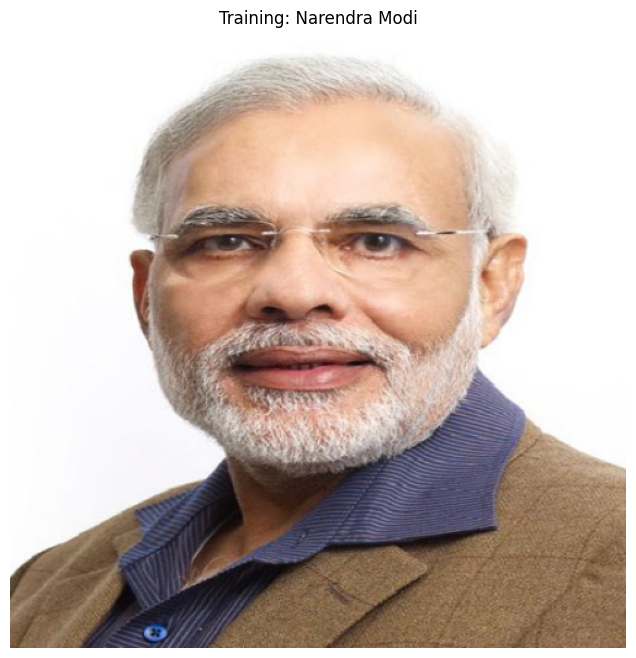

Training in progress for Narendra Modi - 3.jpg


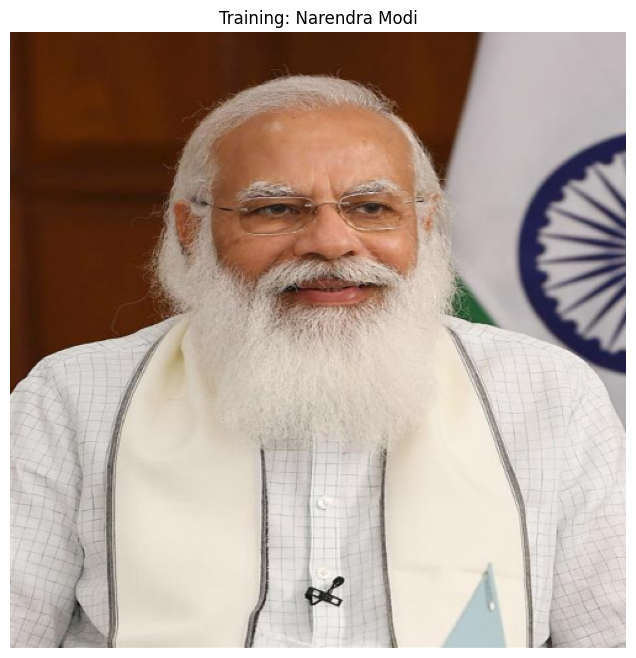

Training in progress for Narendra Modi - 2.jpg


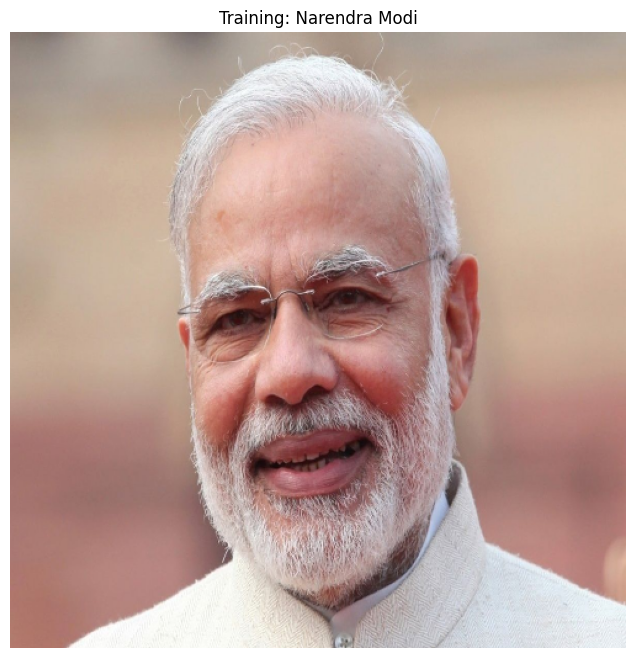

Training in progress for Narendra Modi - 5.jpg


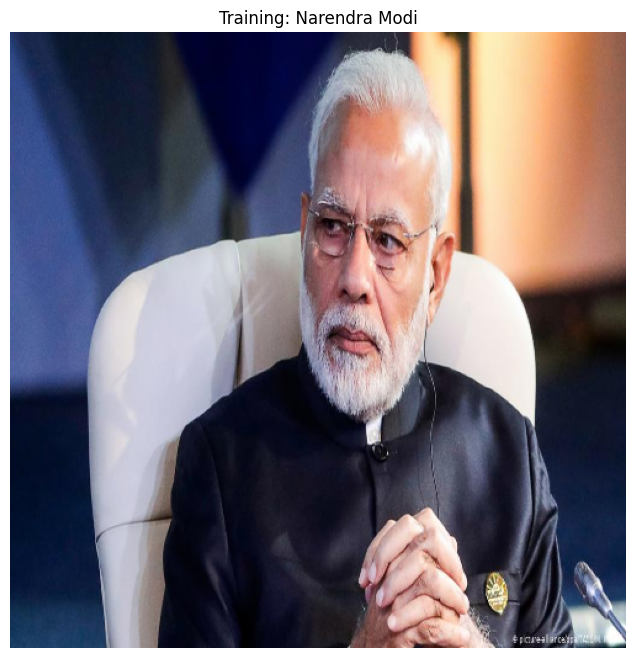

Training in progress for Narendra Modi - 1.jpg


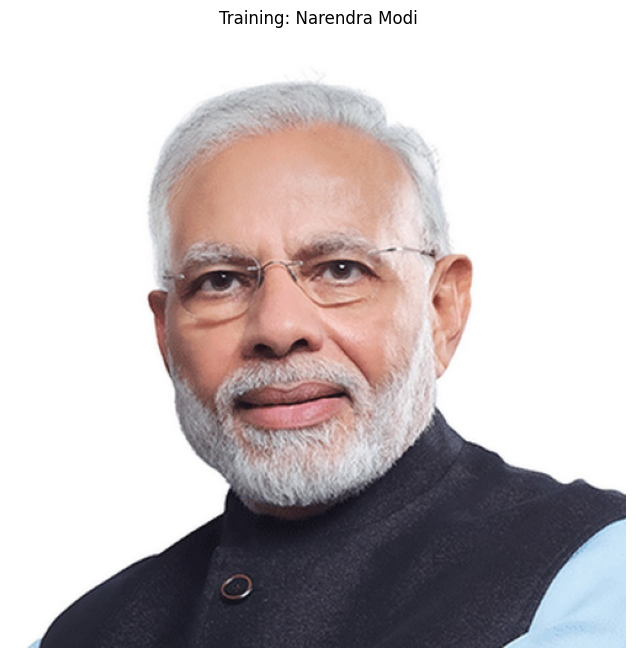

Training in progress for Narendra Modi - 7.jpg


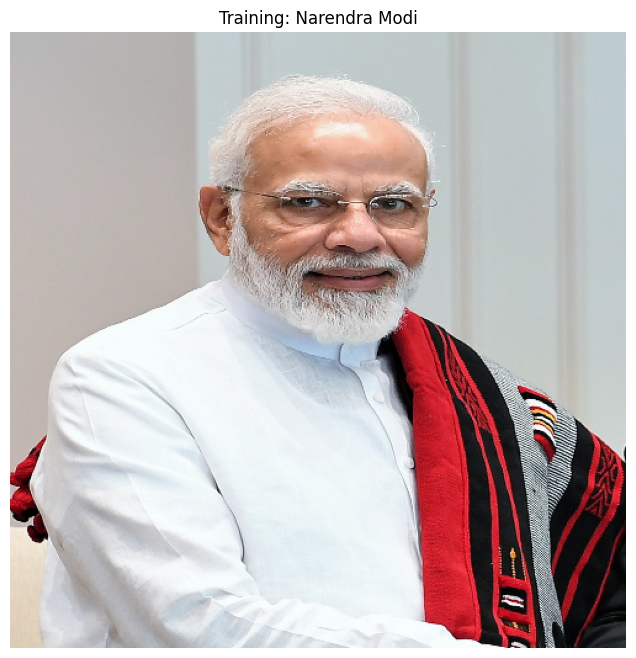

Training in progress for Narendra Modi - 8.jpg


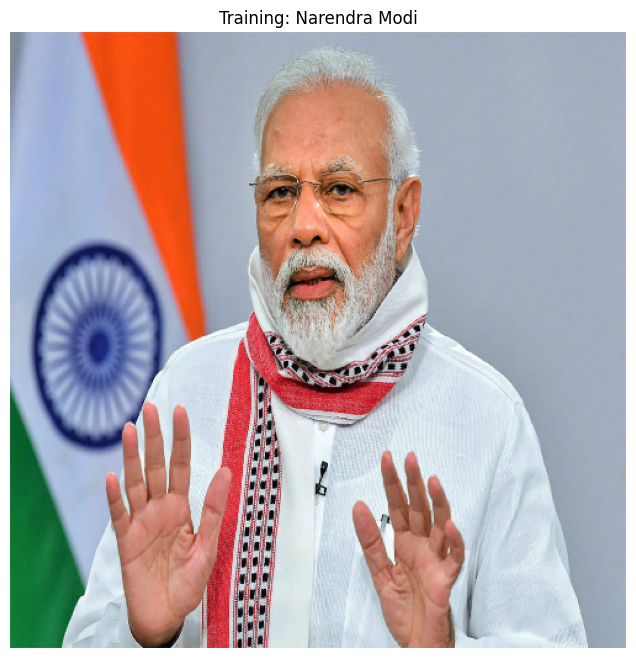

Training in progress for Narendra Modi - 10.jpg


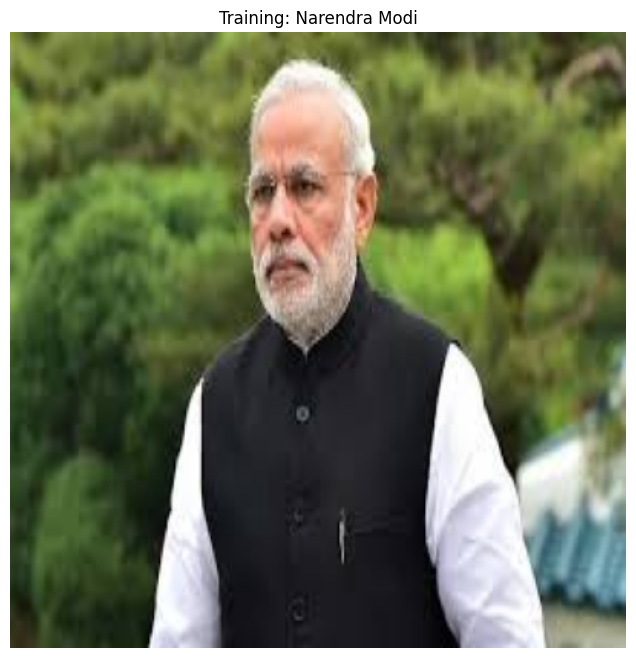

Training in progress for Narendra Modi - 9.jpg


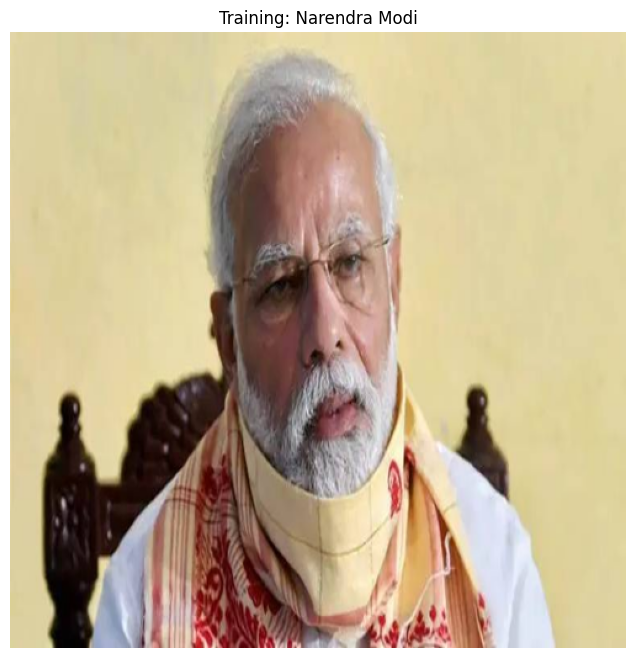

Training in progress for Narendra Modi - 6.jpg


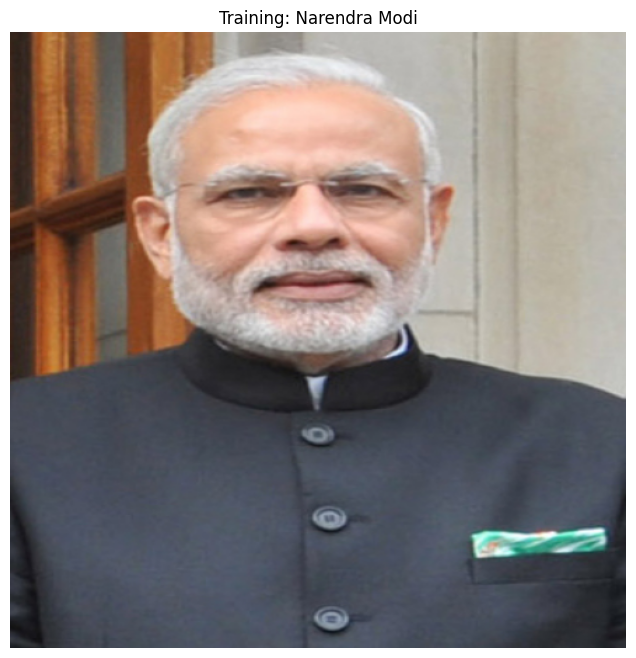

Training in progress for Joe Biden - 4.jpg


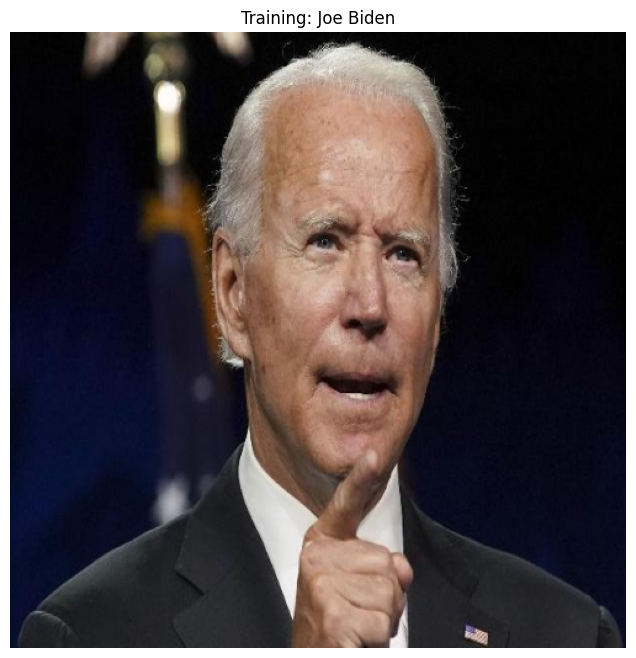

Training in progress for Joe Biden - 3.jpg


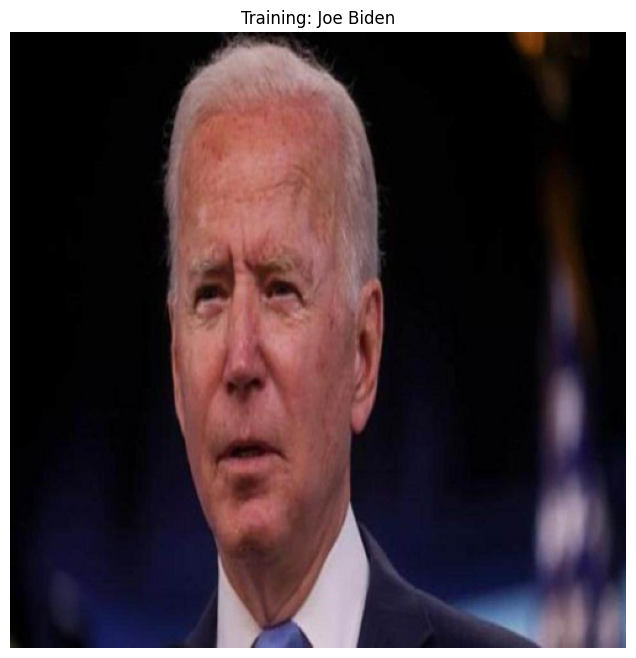

Training in progress for Joe Biden - 2.jpg


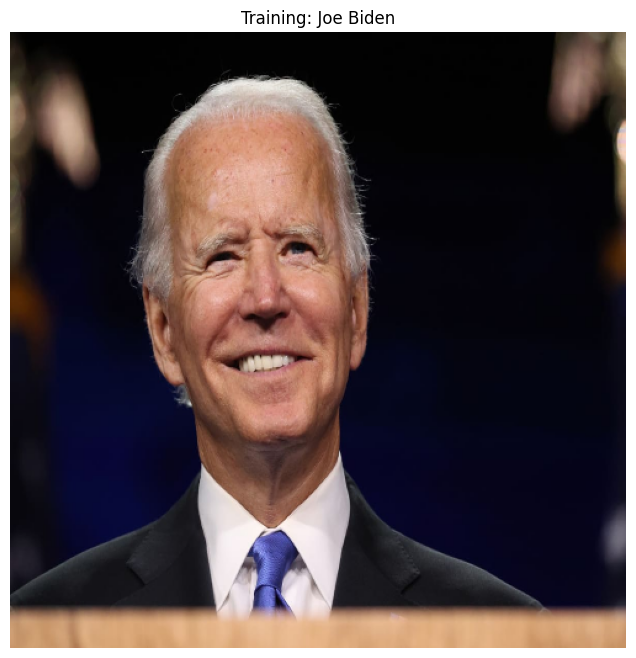

Training in progress for Joe Biden - 5.jpg


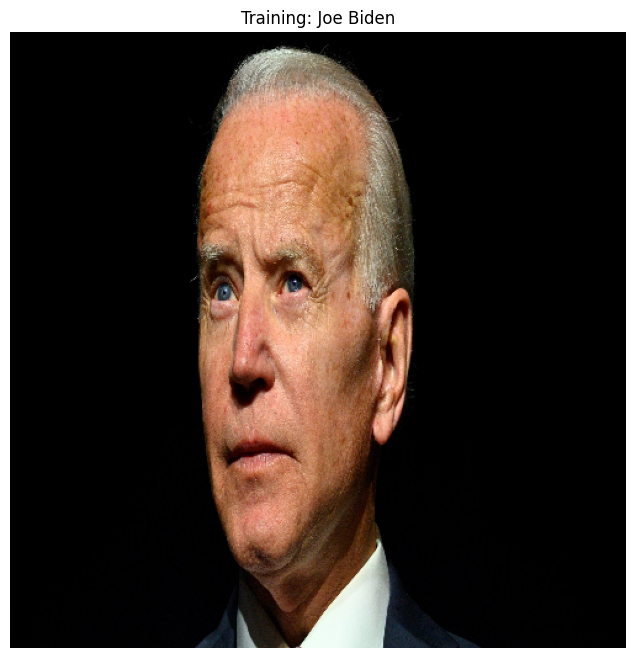

Training in progress for Joe Biden - 1.jpg


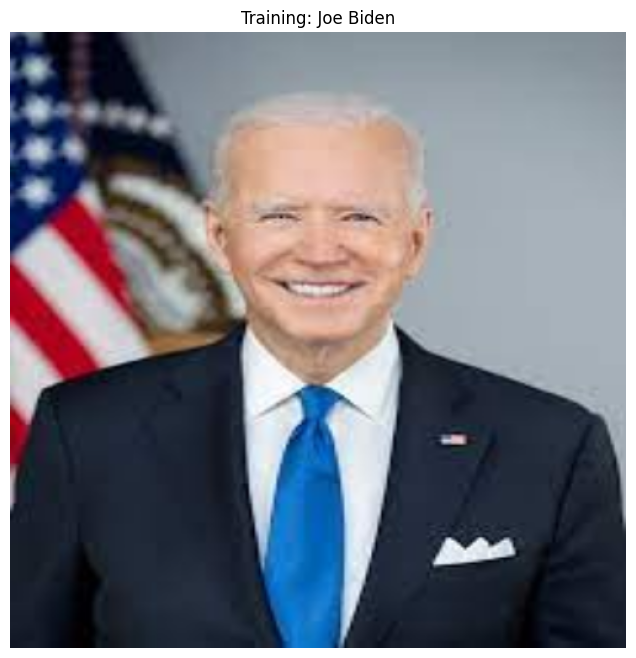

Training in progress for Joe Biden - 7.jpg


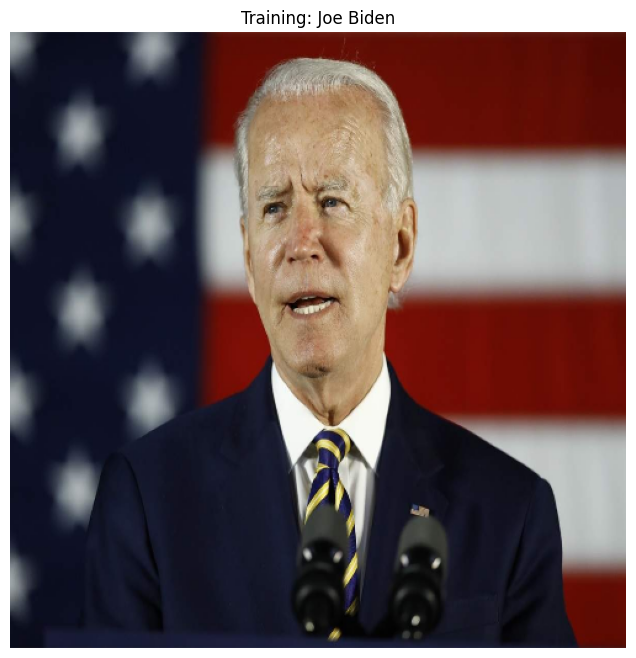

Training in progress for Joe Biden - 8.jpg


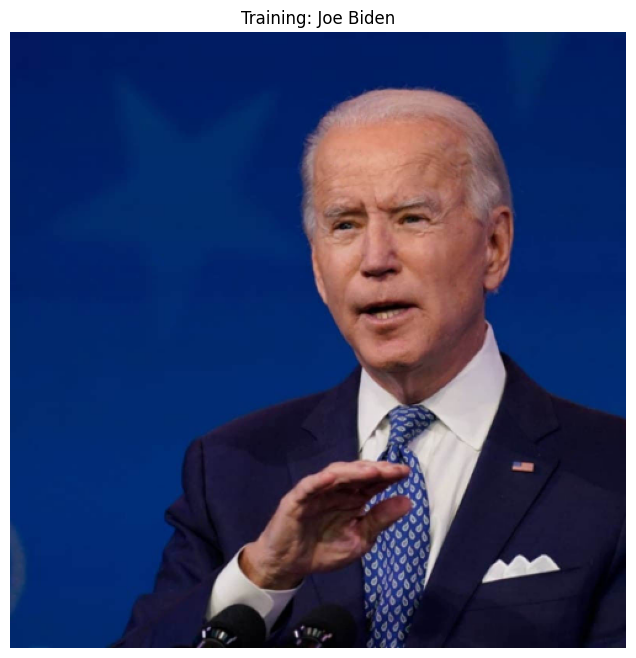

Training in progress for Joe Biden - 10.jpg


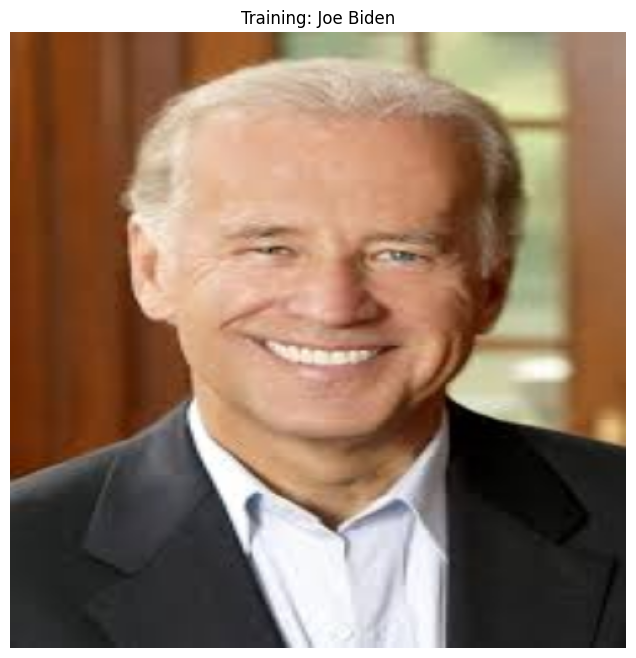

Training in progress for Joe Biden - 9.jpg


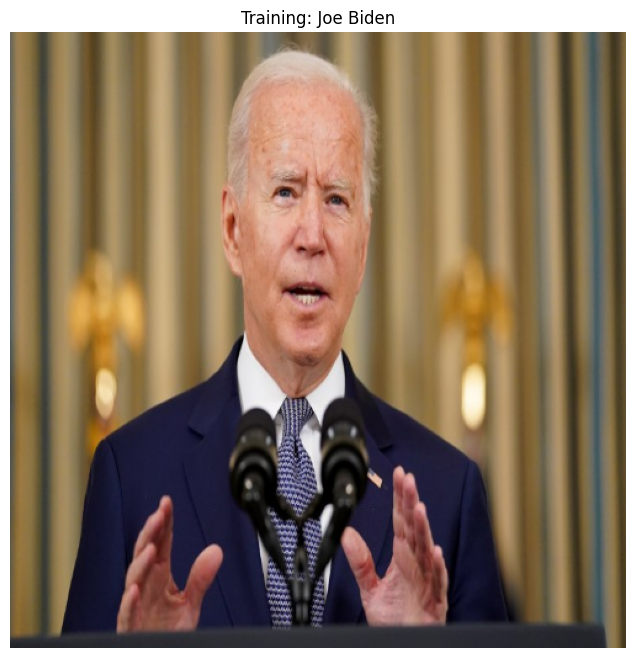

Training in progress for Joe Biden - 6.jpg


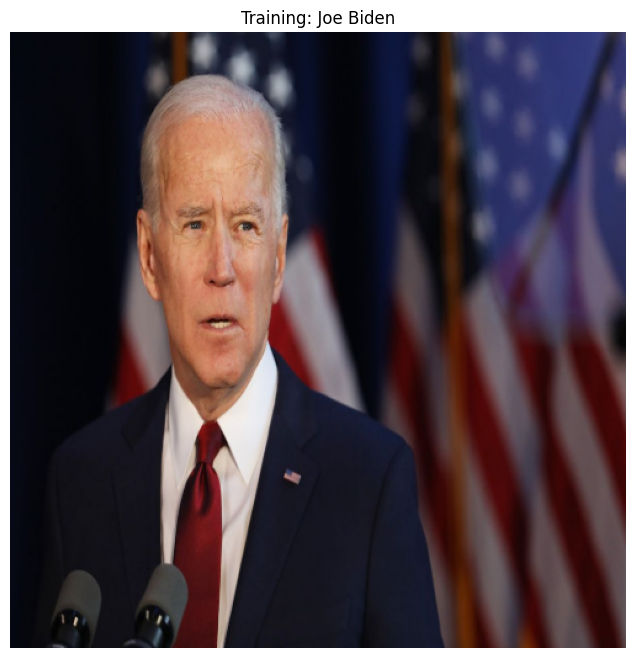

Total faces: 20
Total names: 2
Training completed!
Prediction: Joe Biden (Distance: 29.75)


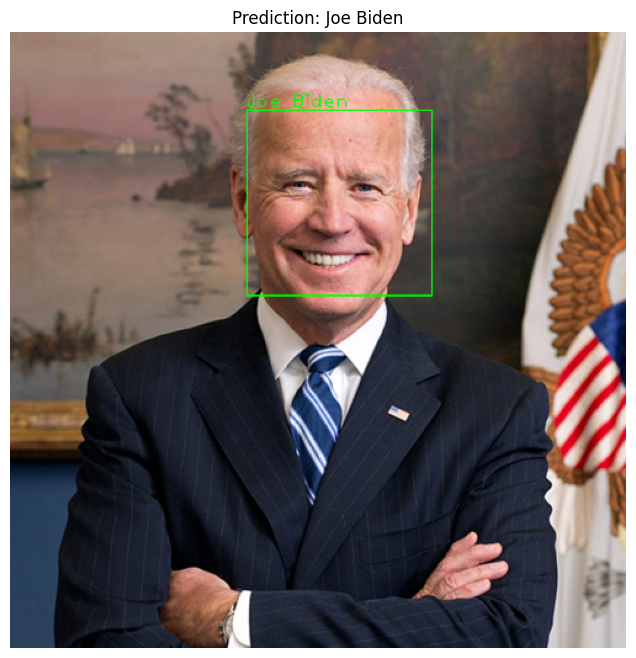

In [5]:
# install opencv-contrib using the command
# pip install --user opencv-contrib-python matplotlib

# import the required libraries
import cv2
import numpy as np
import os
from sys import exit
from matplotlib import pyplot as plt

# Configure matplotlib for inline display in Jupyter
%matplotlib inline

# Helper function to display images in Jupyter
def show_image(title, image, cmap=None):
    """Display image in Jupyter notebook"""
    plt.figure(figsize=(8, 8))
    if cmap:
        plt.imshow(image, cmap=cmap)
    else:
        # Convert BGR to RGB for proper color display
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(image_rgb)
    plt.title(title)
    plt.axis('off')
    plt.show()


# function to detect face from image
def face_detection(image_to_detect):
    # converting the image to grayscale since its required for eigen and fisher faces
    image_to_detect_gray = cv2.cvtColor(image_to_detect, cv2.COLOR_BGR2GRAY)
    
    # load the pretrained model for face detection
    # lbpcascade is recommended for LBPH
    # haarcascade is recommended for Eigenface and Fisherface haarcascade_frontalface_default.xml
    # download lpbcascade from https://raw.githubusercontent.com/opencv/opencv/master/data/lbpcascades/lbpcascade_frontalface.xml
    face_detection_classifier = cv2.CascadeClassifier('models/haarcascade_frontalface_default.xml')
    # can also use lbpcascade_frontalface.xml
    
    # detect all face locations in the image using classifier
    all_face_locations = face_detection_classifier.detectMultiScale(image_to_detect_gray)
    
    # if no faces are detected
    if (len(all_face_locations) == 0):
        return None, None
    
    # splitting the tuple to get four face positions
    x, y, width, height = all_face_locations[0]
    
    # calculating face coordinates
    face_coordinates = image_to_detect_gray[y:y+width, x:x+height]
    
    # training and testing images should be of same size for eigen and fisher faces
    # for LBPH its optional
    face_coordinates = cv2.resize(face_coordinates, (500, 500))
    
    # return the face detected and face location
    return face_coordinates, all_face_locations[0]


# function to prepare training data
def prepare_training_data(images_dir, label_index):
    
    # list to hold all the faces and label indexes
    faces_coordinates = []
    labels_index = []
    
    # get the image names from the given directory
    images = os.listdir(images_dir)
    
    for image in images:
        # Skip hidden files and non-image files
        if image.startswith('.'):
            continue
            
        image_path = images_dir + "/" + image
        training_image = cv2.imread(image_path)
        
        # Check if image was loaded successfully
        if training_image is None:
            print(f"Warning: Could not read image {image_path}, skipping...")
            continue
        
        # display the current image taken for training
        print(f"Training in progress for {names[label_index]} - {image}")
        show_image(f"Training: {names[label_index]}", cv2.resize(training_image, (500, 500)))
        
        # detect face using the method for detection
        face_coordinates, box_coordinates = face_detection(training_image)
        
        if face_coordinates is not None:
            # add the returned face to the list of faces
            faces_coordinates.append(face_coordinates)
            labels_index.append(label_index)
        else:
            print(f"Warning: No face detected in {image_path}")
    
    return faces_coordinates, labels_index


###### preprocessing ##############
names = []

names.append("Narendra Modi")
face_coordinates_modi, labels_index_modi = prepare_training_data("dataset/training/modi", 0)
    
names.append("Joe Biden")
face_coordinates_biden, labels_index_biden = prepare_training_data("dataset/training/biden", 1)
    
face_coordinates = face_coordinates_modi + face_coordinates_biden
labels_index = labels_index_modi + labels_index_biden

# print total number of faces and names
print("Total faces:", len(face_coordinates))
print("Total names:", len(names))


######## training ###############

# create the instance of face recognizer
face_classifier = cv2.face.LBPHFaceRecognizer_create()
# cv2.face.EigenFaceRecognizer_create()
# cv2.face.FisherFaceRecognizer_create()
# cv2.face.LBPHFaceRecognizer_create()

face_classifier.train(face_coordinates, np.array(labels_index))
print("Training completed!")


######## prediction ##############
image_to_classify = cv2.imread("dataset/testing/joe1.jpg")

# Check if test image was loaded successfully
if image_to_classify is None:
    print("Error: Could not read test image 'dataset/testing/joe1.jpg'")
else:
    # make a copy of the image
    image_to_classify_copy = image_to_classify.copy()
    
    # get the face from the image
    face_coordinates_classify, box_locations = face_detection(image_to_classify_copy)  
    
    # if no faces are returned
    if face_coordinates_classify is None:
        print("There are no faces in the image to classify")
    else:
        # if not none, we have predict the face
        name_index, distance = face_classifier.predict(face_coordinates_classify)
        name = names[name_index]
        distance = abs(distance)
        
        # draw bounding box and text for the face detected
        (x, y, w, h) = box_locations
        cv2.rectangle(image_to_classify, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(image_to_classify, name, (x, y-5), cv2.FONT_HERSHEY_PLAIN, 2.5, (0, 255, 0), 2)
        
        # show the image
        print(f"Prediction: {name} (Distance: {distance:.2f})")
        show_image(f"Prediction: {name}", cv2.resize(image_to_classify, (500, 500)))